In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from process_data import PreProcessData, PostProcessData

In [2]:
train = PreProcessData.train
test = PreProcessData.test

In [86]:
lgbm_sub = pd.read_csv('submission_20250129_au_multi_product.csv')

In [76]:
merged_test = pd.merge(test,lgbm_sub)

In [77]:
complete_df = pd.concat([train, merged_test]).reset_index(drop=True)

In [78]:
complete_df['date'] = pd.to_datetime(complete_df['date'], format='%Y-%m-%d')

In [79]:
def plot_individual_ts(df):
    colour_map = {"Canada": "blue", "Finland": "orange", "Italy": "green", "Kenya":"red", "Norway": "purple", "Singapore": "brown"}
    for country in df["country"].unique():
        f,axes = plt.subplots(df["store"].nunique()*df["product"].nunique(),figsize=(20,75))
        count = 0
        for store in df["store"].unique():
            for product in df["product"].unique():
                plot_df = df.loc[(df["product"] == product) & (df["country"] == country) & (df["store"] == store)]
                sns.lineplot(data = plot_df, x= "date", y="num_sold", linewidth=0.5, ax=axes[count], color=colour_map[country])
                axes[count].set_title(f"{country} - {store} - {product}")
                axes[count].axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');
                count+=1

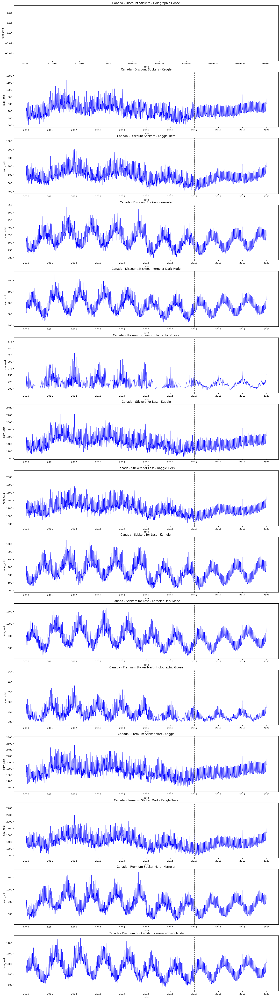

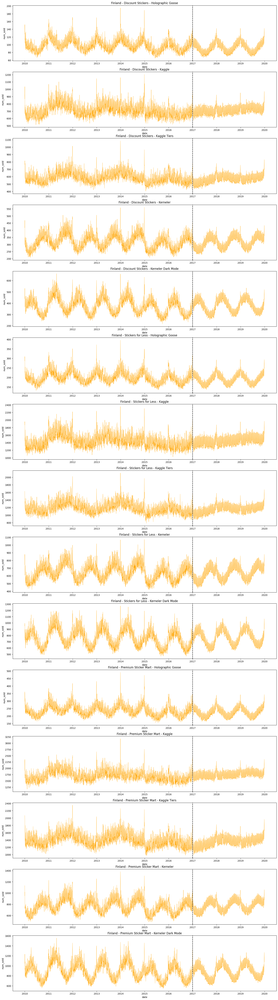

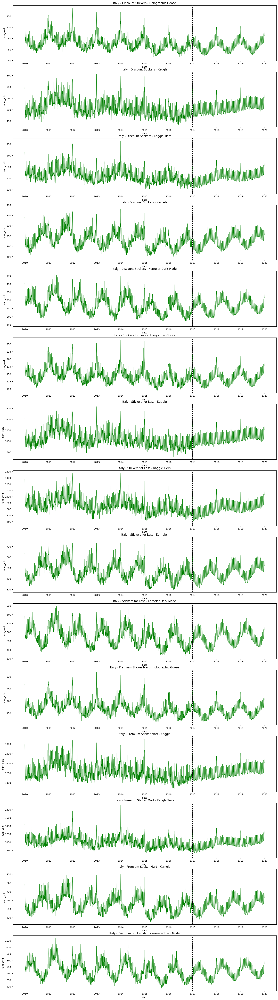

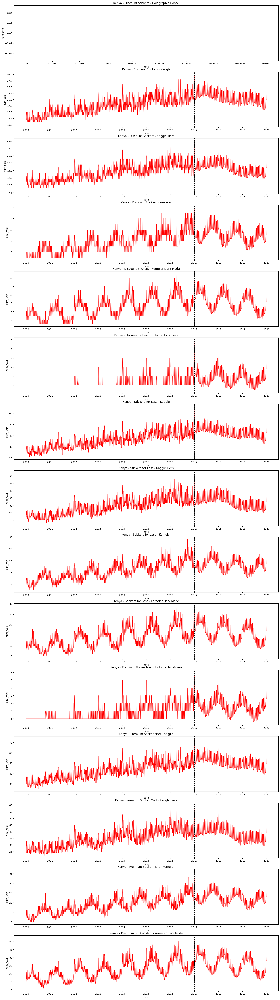

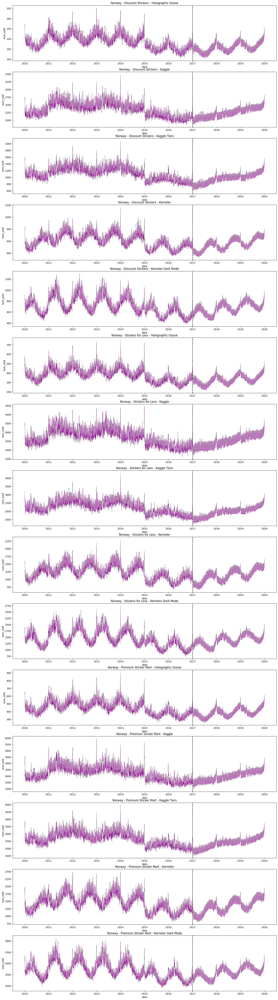

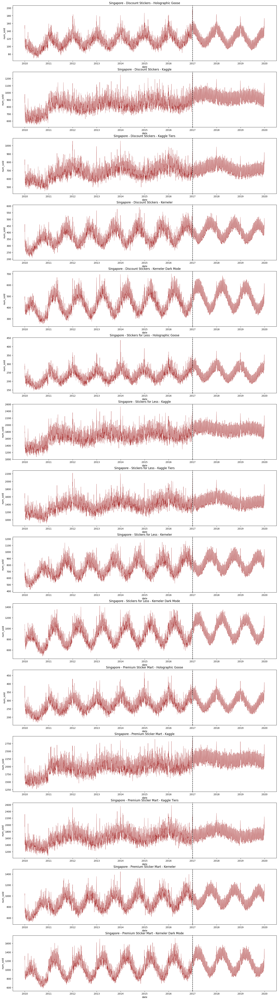

In [80]:
plot_individual_ts(complete_df)

mixing multi_product and multi_rfr_product: kaggle and kaggle tiers with Ridge, rest with rfr

In [85]:
test.head()

,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode


In [98]:
import pandas as pd

# test
df1 = test

# ridge (kaggle, kagge_tiers)
df2 = pd.read_csv('submission_20250129_au_multi_product.csv')
display('ridge', df2.tail())

# rfr
df3 = pd.read_csv('submission_20250129_au_multi_rfr_product.csv')
display('rfr', df3.tail())

# Step 1: Get indexes where column 'X' in df1 matches the condition
condition_indexes = df1[df1['product'].isin(['Kaggle','Kaggle Tiers'])].index

# Step 2: Replace values in df2 using df3 at those indexes
df3.loc[condition_indexes, 'num_sold'] = df2.loc[condition_indexes, 'num_sold']

# Show the result
display('result', df3.tail())

'ridge'

,id,num_sold
98545,328675,349.493012
98546,328676,2263.506644
98547,328677,1887.178817
98548,328678,1004.344923
98549,328679,1253.001320


'rfr'

,id,num_sold
98545,328675,315.359071
98546,328676,2388.568849
98547,328677,1905.897856
98548,328678,904.291855
98549,328679,1026.468580


'result'

,id,num_sold
98545,328675,315.359071
98546,328676,2263.506644
98547,328677,1887.178817
98548,328678,904.291855
98549,328679,1026.468580


In [96]:
df3.to_csv('submission_20250129_au_multi_mixed_product.csv', index=False)